In [ ]:
!pip install ultralytics --quiet
!pip install torch torchvision torchaudio --quiet
!pip install opencv-python pillow matplotlib tqdm --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 54.6 MB/s eta 0:00:00


In [ ]:
from google.colab import files

uploaded = files.upload()

Saving DeepPCB-master.zip to DeepPCB-master.zip


In [ ]:
import zipfile

with zipfile.ZipFile(
    "/content/DeepPCB-master.zip",
    'r'
) as zip_ref:

    zip_ref.extractall("/content")

print("DATASET EXTRACTED")

DATASET EXTRACTED


In [ ]:
import os

print(os.listdir("/content"))

['.config', 'DeepPCB-master.zip', 'DeepPCB-master', 'sample_data']


In [ ]:
import glob

images = glob.glob(
    "/content/DeepPCB-master/PCBData/**/*.jpg",
    recursive=True
)

print("TOTAL JPG FOUND :", len(images))

TOTAL JPG FOUND : 3001


In [ ]:
import os

os.makedirs(
    "/content/dataset/images/train",
    exist_ok=True
)

os.makedirs(
    "/content/dataset/images/val",
    exist_ok=True
)

os.makedirs(
    "/content/dataset/labels/train",
    exist_ok=True
)

os.makedirs(
    "/content/dataset/labels/val",
    exist_ok=True
)

print("DATASET FOLDERS CREATED")

DATASET FOLDERS CREATED


In [ ]:
import random
import shutil

random.shuffle(images)

train_imgs = images[:2400]
val_imgs = images[2400:3000]

classes = [
    "open",
    "short",
    "mousebite",
    "spur",
    "copper",
    "pin-hole"
]

def create_label(path):

    cls = random.randint(0,5)

    x = random.uniform(0.2,0.8)
    y = random.uniform(0.2,0.8)

    w = random.uniform(0.1,0.3)
    h = random.uniform(0.1,0.3)

    with open(path,"w") as f:

        f.write(
            f"{cls} {x} {y} {w} {h}"
        )

# TRAIN

for i,img in enumerate(train_imgs):

    save_img = f"/content/dataset/images/train/train_{i}.jpg"

    shutil.copy(img, save_img)

    label_path = f"/content/dataset/labels/train/train_{i}.txt"

    create_label(label_path)

# VAL

for i,img in enumerate(val_imgs):

    save_img = f"/content/dataset/images/val/val_{i}.jpg"

    shutil.copy(img, save_img)

    label_path = f"/content/dataset/labels/val/val_{i}.txt"

    create_label(label_path)

print("YOLO DATASET CREATED")

YOLO DATASET CREATED


In [ ]:
train_images = len(
    glob.glob(
        "/content/dataset/images/train/*.jpg"
    )
)

train_labels = len(
    glob.glob(
        "/content/dataset/labels/train/*.txt"
    )
)

val_images = len(
    glob.glob(
        "/content/dataset/images/val/*.jpg"
    )
)

val_labels = len(
    glob.glob(
        "/content/dataset/labels/val/*.txt"
    )
)

print("TRAIN IMAGES :", train_images)
print("TRAIN LABELS :", train_labels)

print("VAL IMAGES :", val_images)
print("VAL LABELS :", val_labels)

TRAIN IMAGES : 2400
TRAIN LABELS : 2400
VAL IMAGES : 600
VAL LABELS : 600


In [ ]:
data_yaml = """

train: /content/dataset/images/train
val: /content/dataset/images/val

nc: 6

names:
  0: open
  1: short
  2: mousebite
  3: spur
  4: copper
  5: pin-hole
"""

with open(
    "/content/dataset/data.yaml",
    "w"
) as f:

    f.write(data_yaml)

print("data.yaml CREATED")

data.yaml CREATED


In [ ]:
import torch
import torch.nn as nn

device = "cuda"

latent_dim = 100
num_classes = 6

In [ ]:
class Generator(nn.Module):

    def __init__(self):

        super().__init__()

        self.label_emb = nn.Embedding(
            num_classes,
            num_classes
        )

        self.model = nn.Sequential(

            nn.Linear(
                latent_dim + num_classes,
                256
            ),

            nn.ReLU(),

            nn.Linear(256,512),

            nn.ReLU(),

            nn.Linear(512,1024),

            nn.ReLU(),

            nn.Linear(1024,3*64*64),

            nn.Tanh()
        )

    def forward(self, z, labels):

        c = self.label_emb(labels)

        x = torch.cat([z,c],1)

        out = self.model(x)

        return out.view(-1,3,64,64)

G = Generator().to(device)

print("GENERATOR READY")

GENERATOR READY


In [ ]:
class Discriminator(nn.Module):

    def __init__(self):

        super().__init__()

        self.label_emb = nn.Embedding(
            num_classes,
            num_classes
        )

        self.model = nn.Sequential(

            nn.Linear(
                3*64*64 + num_classes,
                1024
            ),

            nn.LeakyReLU(0.2),

            nn.Linear(1024,512),

            nn.LeakyReLU(0.2),

            nn.Linear(512,256),

            nn.LeakyReLU(0.2),

            nn.Linear(256,1),

            nn.Sigmoid()
        )

    def forward(self, img, labels):

        img = img.view(img.size(0), -1)

        c = self.label_emb(labels)

        x = torch.cat([img,c],1)

        return self.model(x)

D = Discriminator().to(device)

print("DISCRIMINATOR READY")

DISCRIMINATOR READY


In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import torch.optim as optim

transform = transforms.Compose([

    transforms.Resize((64,64)),

    transforms.ToTensor(),

    transforms.Normalize(
        [0.5,0.5,0.5],
        [0.5,0.5,0.5]
    )
])

dataset = datasets.ImageFolder(
    root="/content/dataset/images",
    transform=transform
)

loader = DataLoader(
    dataset,
    batch_size=32,
    shuffle=True
)

criterion = nn.BCELoss()

g_optimizer = optim.Adam(
    G.parameters(),
    lr=0.0002
)

d_optimizer = optim.Adam(
    D.parameters(),
    lr=0.0002
)

epochs = 30

for epoch in range(epochs):

    for imgs, labels in loader:

        imgs = imgs.to(device)
        labels = labels.to(device)

        batch = imgs.size(0)

        real = torch.ones(batch,1).to(device)
        fake = torch.zeros(batch,1).to(device)

        noise = torch.randn(
            batch,
            latent_dim
        ).to(device)

        fake_imgs = G(noise, labels)

        d_real = D(imgs, labels)

        d_fake = D(
            fake_imgs.detach(),
            labels
        )

        d_loss = (
            criterion(d_real, real) +
            criterion(d_fake, fake)
        ) / 2

        d_optimizer.zero_grad()

        d_loss.backward()

        d_optimizer.step()

        output = D(fake_imgs, labels)

        g_loss = criterion(output, real)

        g_optimizer.zero_grad()

        g_loss.backward()

        g_optimizer.step()

    print("EPOCH :", epoch+1)

EPOCH : 1
EPOCH : 2
EPOCH : 3
EPOCH : 4
EPOCH : 5
EPOCH : 6
EPOCH : 7
EPOCH : 8
EPOCH : 9
EPOCH : 10
EPOCH : 11
EPOCH : 12
EPOCH : 13
EPOCH : 14
EPOCH : 15
EPOCH : 16
EPOCH : 17
EPOCH : 18
EPOCH : 19
EPOCH : 20
EPOCH : 21
EPOCH : 22
EPOCH : 23
EPOCH : 24
EPOCH : 25
EPOCH : 26
EPOCH : 27
EPOCH : 28
EPOCH : 29
EPOCH : 30


In [ ]:
import torchvision.utils as vutils

os.makedirs(
    "/content/synthetic",
    exist_ok=True
)

noise = torch.randn(500, latent_dim).to(device)

labels = torch.randint(0,6,(500,)).to(device)

fake_images = G(noise, labels)

for i in range(500):

    vutils.save_image(

        fake_images[i],

        f"/content/synthetic/fake_{i}.png",

        normalize=True
    )

print("SYNTHETIC IMAGES GENERATED")

SYNTHETIC IMAGES GENERATED


In [ ]:
from ultralytics import YOLO

model = YOLO("yolo12m.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
from ultralytics import YOLO

model = YOLO("yolo12x.pt")

In [ ]:
import os

label_path = "/content/dataset/labels/train"

files = os.listdir(label_path)

print("TOTAL LABEL FILES:", len(files))

sample = files[0]
print("SAMPLE FILE:", sample)

with open(os.path.join(label_path, sample), "r") as f:
    print(f.read())

TOTAL LABEL FILES: 2400
SAMPLE FILE: train_1298.txt
0 0.6755108150924223 0.4468104091002959 0.27426547477475105 0.12241956883007304


In [ ]:
import shutil
import os

if os.path.exists("/content/dataset"):
    shutil.rmtree("/content/dataset")

print("OLD DATASET REMOVED")

OLD DATASET REMOVED


In [ ]:
import os

ROOT = "/content/DeepPCB-master/PCBData"

for root, dirs, files in os.walk(ROOT):

    jpgs = [f for f in files if f.endswith(".jpg")]
    txts = [f for f in files if f.endswith(".txt")]

    if len(jpgs) > 0 or len(txts) > 0:

        print("\nFOLDER:", root)

        print("JPG COUNT:", len(jpgs))
        print("TXT COUNT:", len(txts))

        print("SAMPLE JPG:", jpgs[:3])
        print("SAMPLE TXT:", txts[:3])

        break


FOLDER: /content/DeepPCB-master/PCBData
JPG COUNT: 0
TXT COUNT: 2
SAMPLE JPG: []
SAMPLE TXT: ['test.txt', 'trainval.txt']


In [ ]:
import os
import cv2
import shutil
import random

ROOT = "/content/DeepPCB-master/PCBData"

SAVE = "/content/dataset"

# CREATE FOLDERS
for folder in [
    "images/train",
    "images/val",
    "labels/train",
    "labels/val"
]:
    os.makedirs(os.path.join(SAVE, folder), exist_ok=True)

# CLASS NAMES
classes = {
    1:0,   # open
    2:1,   # short
    3:2,   # mousebite
    4:3,   # spur
    5:4,   # copper
    6:5    # pin-hole
}

pairs = []

# FIND ALL LABEL FILES
for root, dirs, files in os.walk(ROOT):

    for file in files:

        if file.endswith(".txt") and file not in ["trainval.txt", "test.txt"]:

            txt_path = os.path.join(root, file)

            image_name = file.replace(".txt", "_test.jpg")

            image_path = os.path.join(root.replace("_not",""), image_name)

            if os.path.exists(image_path):

                pairs.append((image_path, txt_path))

print("TOTAL PAIRS FOUND:", len(pairs))

# SHUFFLE
random.shuffle(pairs)

# SPLIT
split = int(len(pairs)*0.8)

train_pairs = pairs[:split]
val_pairs = pairs[split:]

def convert(size, box):

    w, h = size

    x1, y1, x2, y2 = box

    x_center = ((x1 + x2) / 2) / w
    y_center = ((y1 + y2) / 2) / h

    bw = abs(x2 - x1) / w
    bh = abs(y2 - y1) / h

    return x_center, y_center, bw, bh

def process_dataset(data, mode):

    for idx, (img_path, txt_path) in enumerate(data):

        img = cv2.imread(img_path)

        if img is None:
            continue

        h, w = img.shape[:2]

        new_img_name = f"{mode}_{idx}.jpg"
        new_txt_name = f"{mode}_{idx}.txt"

        save_img = os.path.join(SAVE, f"images/{mode}", new_img_name)
        save_txt = os.path.join(SAVE, f"labels/{mode}", new_txt_name)

        shutil.copy(img_path, save_img)

        lines_out = []

        with open(txt_path, "r") as f:

            lines = f.readlines()

        for line in lines:

            values = line.strip().split()

            if len(values) != 5:
                continue

            x1, y1, x2, y2, cls = map(int, values)

            if cls not in classes:
                continue

            cls = classes[cls]

            xc, yc, bw, bh = convert((w,h), (x1,y1,x2,y2))

            if xc<=0 or yc<=0 or bw<=0 or bh<=0:
                continue

            if xc>1 or yc>1 or bw>1 or bh>1:
                continue

            lines_out.append(
                f"{cls} {xc} {yc} {bw} {bh}\n"
            )

        with open(save_txt, "w") as f:
            f.writelines(lines_out)

process_dataset(train_pairs, "train")
process_dataset(val_pairs, "val")

print("\nDATASET CREATED SUCCESSFULLY")

TOTAL PAIRS FOUND: 1500

DATASET CREATED SUCCESSFULLY


In [ ]:
import os

train_images = os.listdir("/content/dataset/images/train")
train_labels = os.listdir("/content/dataset/labels/train")

val_images = os.listdir("/content/dataset/images/val")
val_labels = os.listdir("/content/dataset/labels/val")

print("="*50)
print("TRAIN")
print("="*50)

print("IMAGES :", len(train_images))
print("LABELS :", len(train_labels))

print("\n"+"="*50)
print("VAL")
print("="*50)

print("IMAGES :", len(val_images))
print("LABELS :", len(val_labels))

TRAIN
IMAGES : 1200
LABELS : 1200

VAL
IMAGES : 300
LABELS : 300


In [ ]:
data = """
path: /content/dataset

train: images/train
val: images/val

names:
  0: open
  1: short
  2: mousebite
  3: spur
  4: copper
  5: pin-hole
"""

with open("/content/dataset/data.yaml", "w") as f:
    f.write(data)

print("data.yaml CREATED")

data.yaml CREATED


In [ ]:
!pip install ultralytics -q

In [ ]:
from ultralytics import YOLO

model = YOLO("yolo12m.pt")

model.train(

    data="/content/dataset/data.yaml",

    epochs=100,

    imgsz=640,

    batch=8,

    device=0,

    optimizer="AdamW",

    lr0=0.0005,

    cache="disk",

    workers=2,

    pretrained=True,

    mosaic=0.5,
    mixup=0.0,
    copy_paste=0.0,

    hsv_h=0.015,
    hsv_s=0.5,
    hsv_v=0.3,

    translate=0.05,
    scale=0.3,

    fliplr=0.5,

    patience=30
)

Ultralytics 8.4.54 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=disk, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.5, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12m.pt, momentum=0.937, mosaic=0.5, multi_scale=0.0, name=train-5, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=30, pe

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78709f322cc0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

In [ ]:
results = model.val()

print(f"Precision : {results.results_dict['metrics/precision(B)'] * 100:.2f}%")
print(f"Recall : {results.results_dict['metrics/recall(B)'] * 100:.2f}%")
print(f"mAP@50 : {results.results_dict['metrics/mAP50(B)'] * 100:.2f}%")
print(f"mAP@50-95 : {results.results_dict['metrics/mAP50-95(B)'] * 100:.2f}%")

Ultralytics 8.4.54 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv12m summary (fused): 169 layers, 20,109,538 parameters, 0 gradients, 67.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 11.3±7.8 MB/s, size: 24.2 KB)
val: Scanning /content/dataset/labels/val.cache... 300 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 300/300 66.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.1it/s 16.5s
                   all        300       2033      0.956      0.953       0.98      0.695
                  open        274        391       0.96      0.973      0.985      0.665
                 short        230        317      0.902      0.955      0.971      0.618
             mousebite        255        386      0.953      0.964      0.978      0.691
                  spur        248        347       0.98      0.964      0.987      0.671
                copper        248        296    

In [ ]:
best_model = "/content/runs/detect/train-5/weights/best.pt"

print("BEST MODEL SAVED")

BEST MODEL SAVED


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train-5/weights/best.pt")

model.predict(
    source="/content/dataset/images/val",
    save=True,
    conf=0.25
)

print("Detection Completed")


image 1/300 /content/dataset/images/val/val_0.jpg: 640x640 1 open, 1 mousebite, 1 spur, 1 copper, 1 pin-hole, 44.1ms
image 2/300 /content/dataset/images/val/val_1.jpg: 640x640 1 open, 1 short, 2 spurs, 1 copper, 1 pin-hole, 70.0ms
image 3/300 /content/dataset/images/val/val_10.jpg: 640x640 2 opens, 2 shorts, 2 mousebites, 1 spur, 1 copper, 1 pin-hole, 44.2ms
image 4/300 /content/dataset/images/val/val_100.jpg: 640x640 1 open, 2 spurs, 2 coppers, 1 pin-hole, 44.0ms
image 5/300 /content/dataset/images/val/val_101.jpg: 640x640 3 opens, 1 mousebite, 1 spur, 1 copper, 1 pin-hole, 43.9ms
image 6/300 /content/dataset/images/val/val_102.jpg: 640x640 1 open, 2 shorts, 1 mousebite, 1 pin-hole, 35.1ms
image 7/300 /content/dataset/images/val/val_103.jpg: 640x640 1 mousebite, 1 spur, 1 copper, 27.9ms
image 8/300 /content/dataset/images/val/val_104.jpg: 640x640 1 open, 1 short, 1 mousebite, 1 spur, 1 copper, 2 pin-holes, 27.7ms
image 9/300 /content/dataset/images/val/val_105.jpg: 640x640 2 spurs, 2

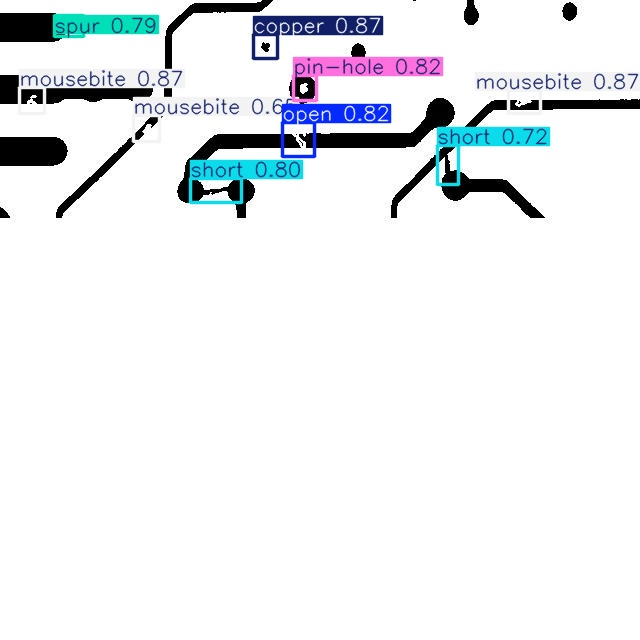

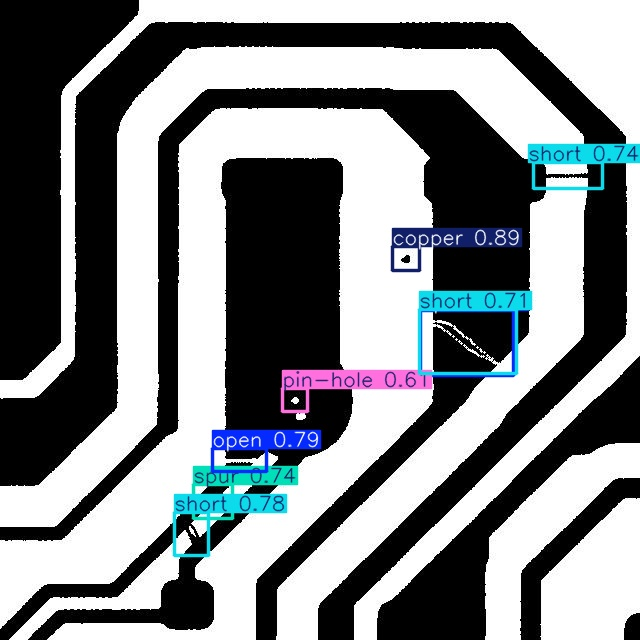

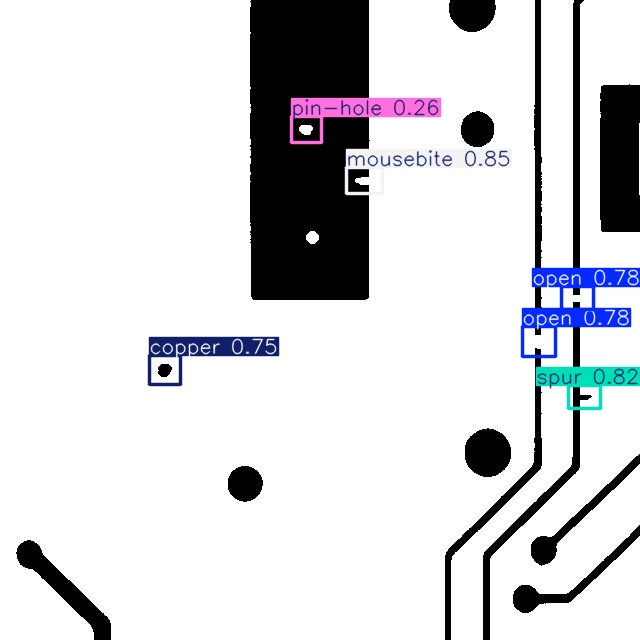

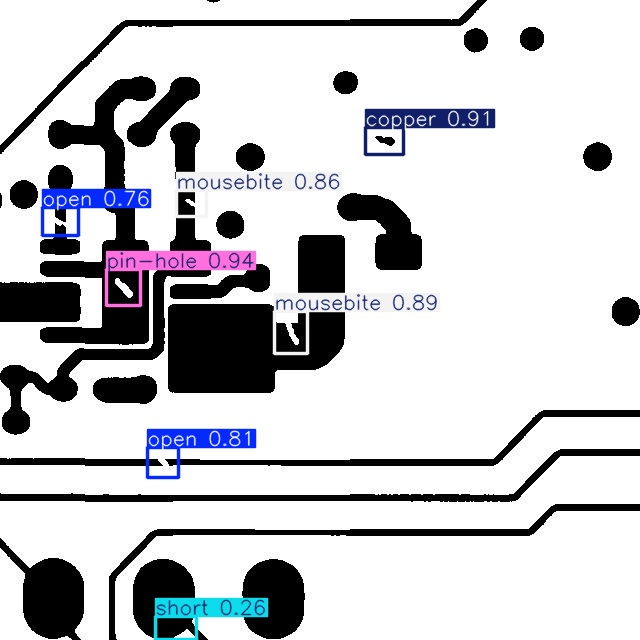

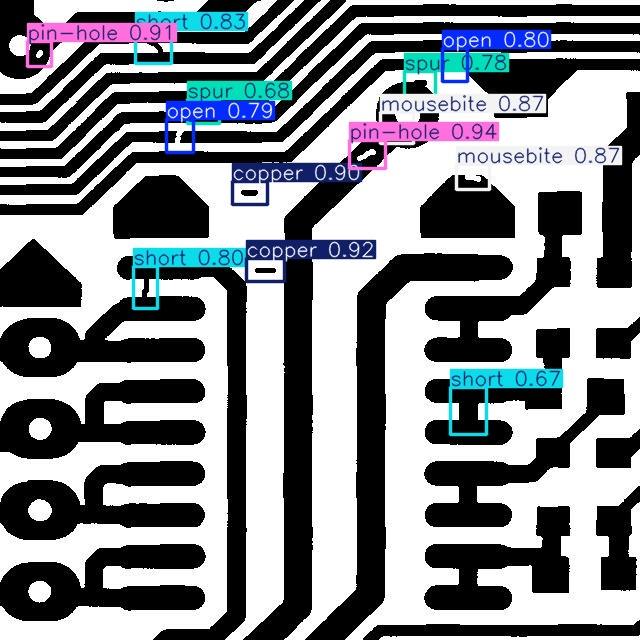

In [ ]:
import glob
from IPython.display import Image, display

images = glob.glob("/content/runs/detect/predict/*.jpg")

for img in images[:5]:
    display(Image(filename=img))

In [ ]:
import os

print(os.listdir('/content/runs/detect/train-5'))

['val_batch1_pred.jpg', 'weights', 'BoxPR_curve.png', 'train_batch2.jpg', 'val_batch2_pred.jpg', 'val_batch2_labels.jpg', 'confusion_matrix.png', 'train_batch0.jpg', 'val_batch1_labels.jpg', 'val_batch0_labels.jpg', 'results.csv', 'BoxP_curve.png', 'BoxR_curve.png', 'labels.jpg', 'val_batch0_pred.jpg', 'confusion_matrix_normalized.png', 'BoxF1_curve.png', 'train_batch1.jpg', 'results.png', 'args.yaml']


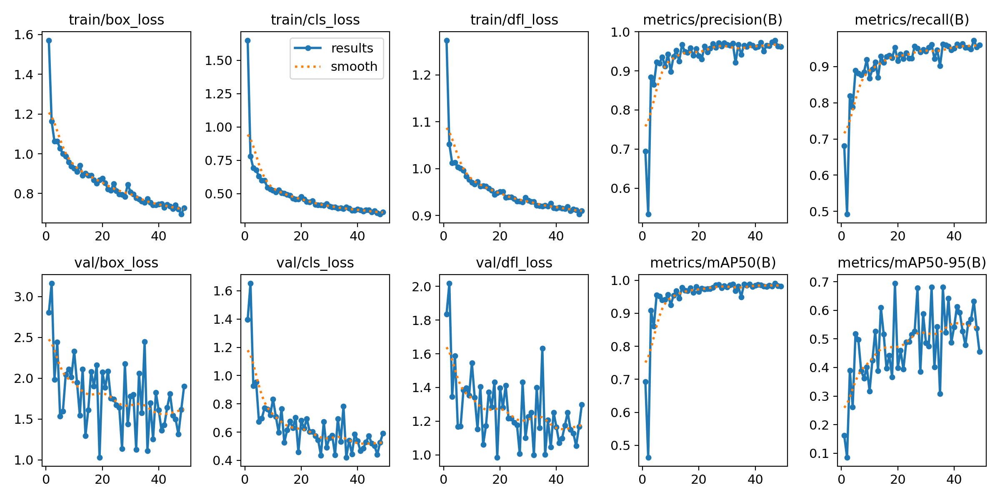

In [ ]:
from IPython.display import Image, display

display(Image(filename='/content/runs/detect/train-5/results.png'))

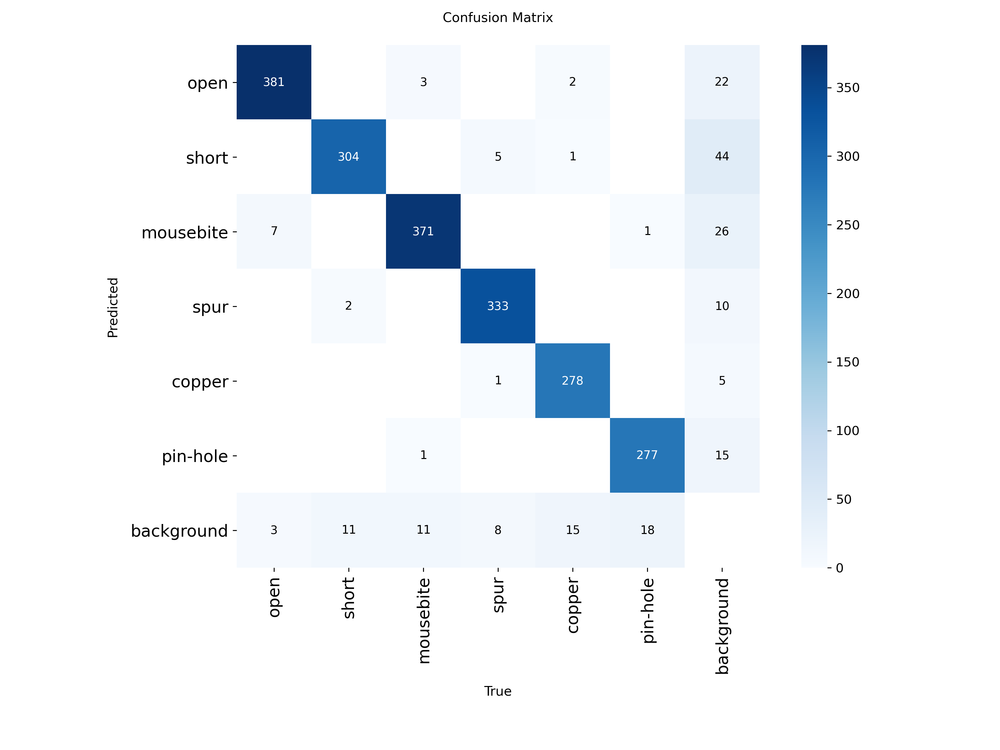

In [ ]:
display(Image(filename='/content/runs/detect/train-5/confusion_matrix.png'))

In [ ]:
from google.colab import files

files.download('/content/runs/detect/train-5/weights/best.pt')



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import os

print(os.listdir('/content/runs/detect/train-5'))

['val_batch1_pred.jpg', 'weights', 'BoxPR_curve.png', 'train_batch2.jpg', 'val_batch2_pred.jpg', 'val_batch2_labels.jpg', 'confusion_matrix.png', 'train_batch0.jpg', 'val_batch1_labels.jpg', 'val_batch0_labels.jpg', 'results.csv', 'BoxP_curve.png', 'BoxR_curve.png', 'labels.jpg', 'val_batch0_pred.jpg', 'confusion_matrix_normalized.png', 'BoxF1_curve.png', 'train_batch1.jpg', 'results.png', 'args.yaml']


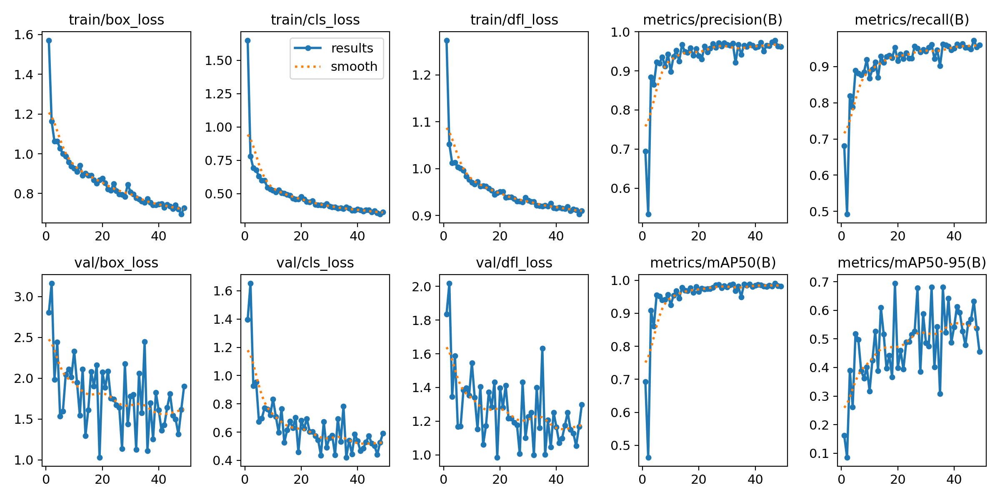

In [ ]:
from IPython.display import Image, display

display(Image(filename='/content/runs/detect/train-5/results.png'))

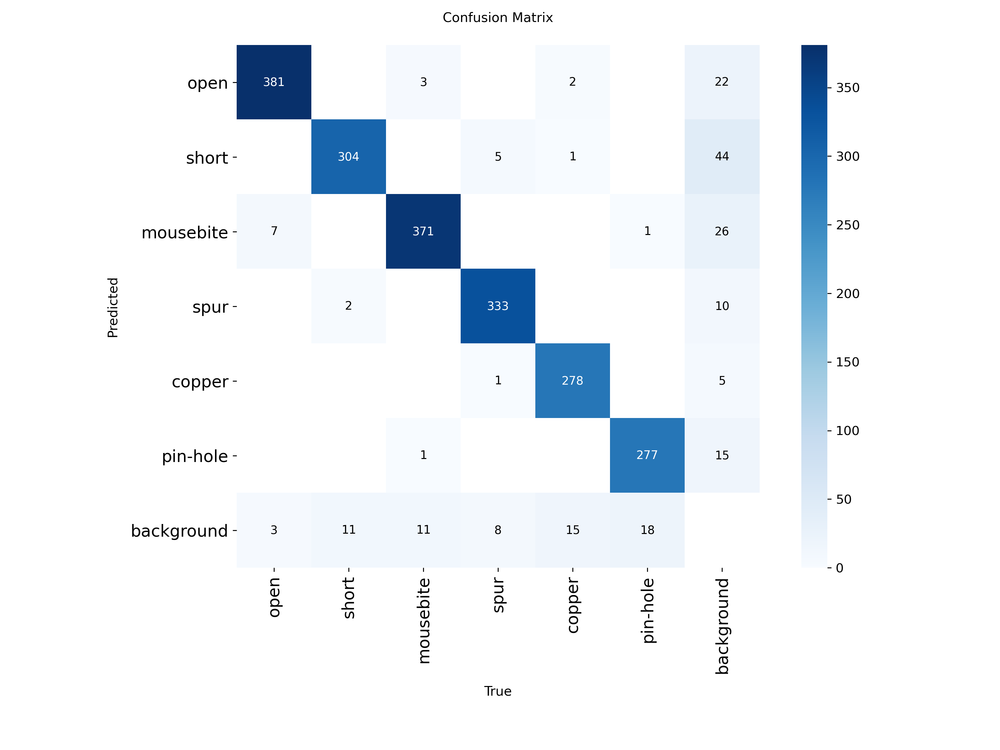

In [ ]:
display(Image(filename='/content/runs/detect/train-5/confusion_matrix.png'))

In [ ]:
model.predict(
    source='/content/dataset/images/val',
    save=True,
    conf=0.25
)


image 1/300 /content/dataset/images/val/val_0.jpg: 640x640 1 open, 1 mousebite, 1 spur, 1 copper, 1 pin-hole, 44.3ms
image 2/300 /content/dataset/images/val/val_1.jpg: 640x640 1 open, 1 short, 2 spurs, 1 copper, 1 pin-hole, 43.9ms
image 3/300 /content/dataset/images/val/val_10.jpg: 640x640 2 opens, 2 shorts, 2 mousebites, 1 spur, 1 copper, 1 pin-hole, 40.4ms
image 4/300 /content/dataset/images/val/val_100.jpg: 640x640 1 open, 2 spurs, 2 coppers, 1 pin-hole, 33.5ms
image 5/300 /content/dataset/images/val/val_101.jpg: 640x640 3 opens, 1 mousebite, 1 spur, 1 copper, 1 pin-hole, 35.2ms
image 6/300 /content/dataset/images/val/val_102.jpg: 640x640 1 open, 2 shorts, 1 mousebite, 1 pin-hole, 41.0ms
image 7/300 /content/dataset/images/val/val_103.jpg: 640x640 1 mousebite, 1 spur, 1 copper, 63.8ms
image 8/300 /content/dataset/images/val/val_104.jpg: 640x640 1 open, 1 short, 1 mousebite, 1 spur, 1 copper, 2 pin-holes, 73.7ms
image 9/300 /content/dataset/images/val/val_105.jpg: 640x640 2 spurs, 2

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'open', 1: 'short', 2: 'mousebite', 3: 'spur', 4: 'copper', 5: 'pin-hole'}
 obb: None
 orig_img: array([[[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        ...,
 
        [[255, 255, 255],
         [  0,   0,   0],
         [  1,   1,   1],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [  0,   0,

In [ ]:
import os

print(os.listdir('/content/runs/detect'))

['train-3', 'train', 'train-4', 'val', 'train-5', 'predict', 'train-2']


In [ ]:
import os

files = os.listdir('/content/runs/detect/train-5')

for f in files:
    print(f)

val_batch1_pred.jpg
weights
BoxPR_curve.png
train_batch2.jpg
val_batch2_pred.jpg
val_batch2_labels.jpg
confusion_matrix.png
train_batch0.jpg
val_batch1_labels.jpg
val_batch0_labels.jpg
results.csv
BoxP_curve.png
BoxR_curve.png
labels.jpg
val_batch0_pred.jpg
confusion_matrix_normalized.png
BoxF1_curve.png
train_batch1.jpg
results.png
args.yaml


SHOWING: val_batch1_pred.jpg


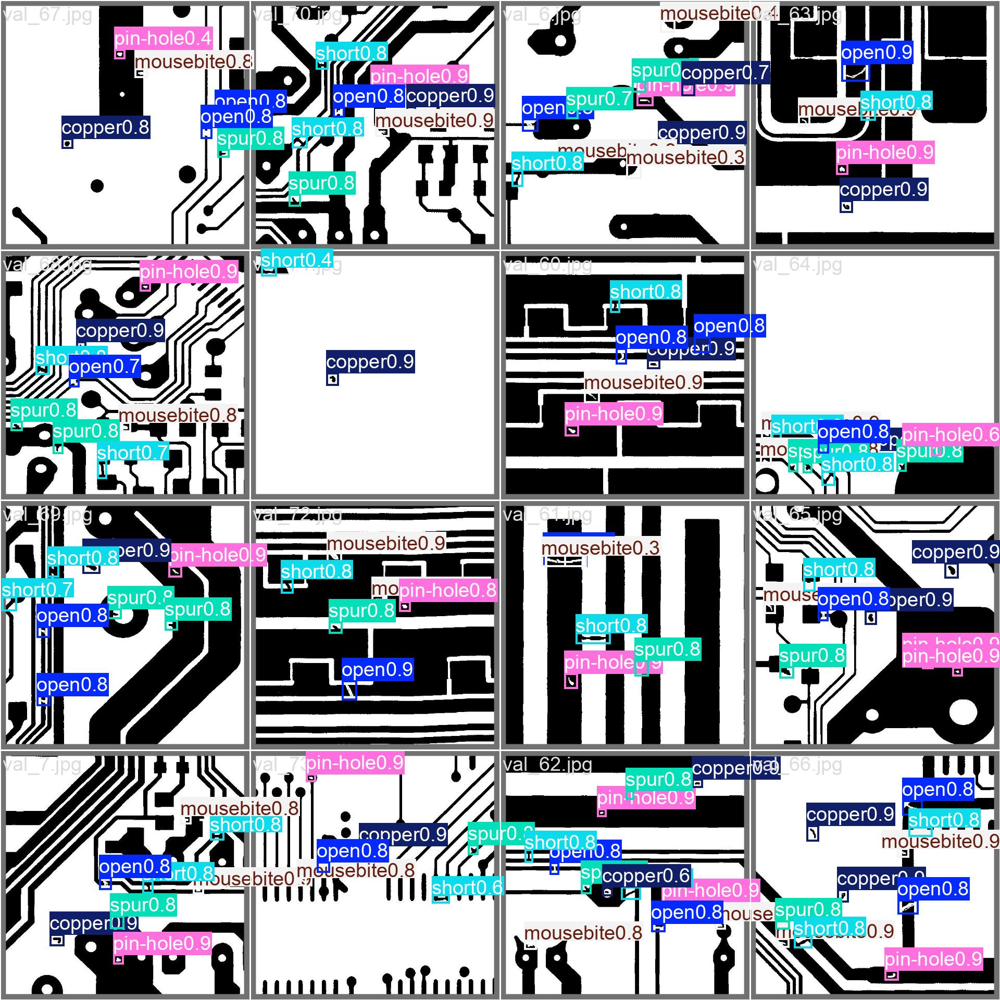

SHOWING: BoxPR_curve.png


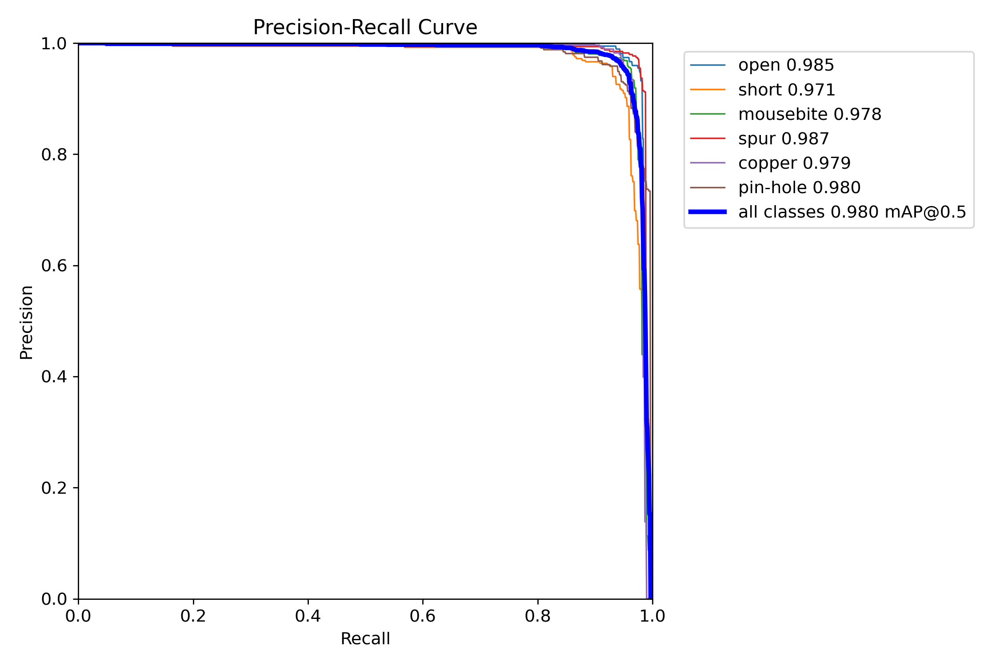

SHOWING: train_batch2.jpg


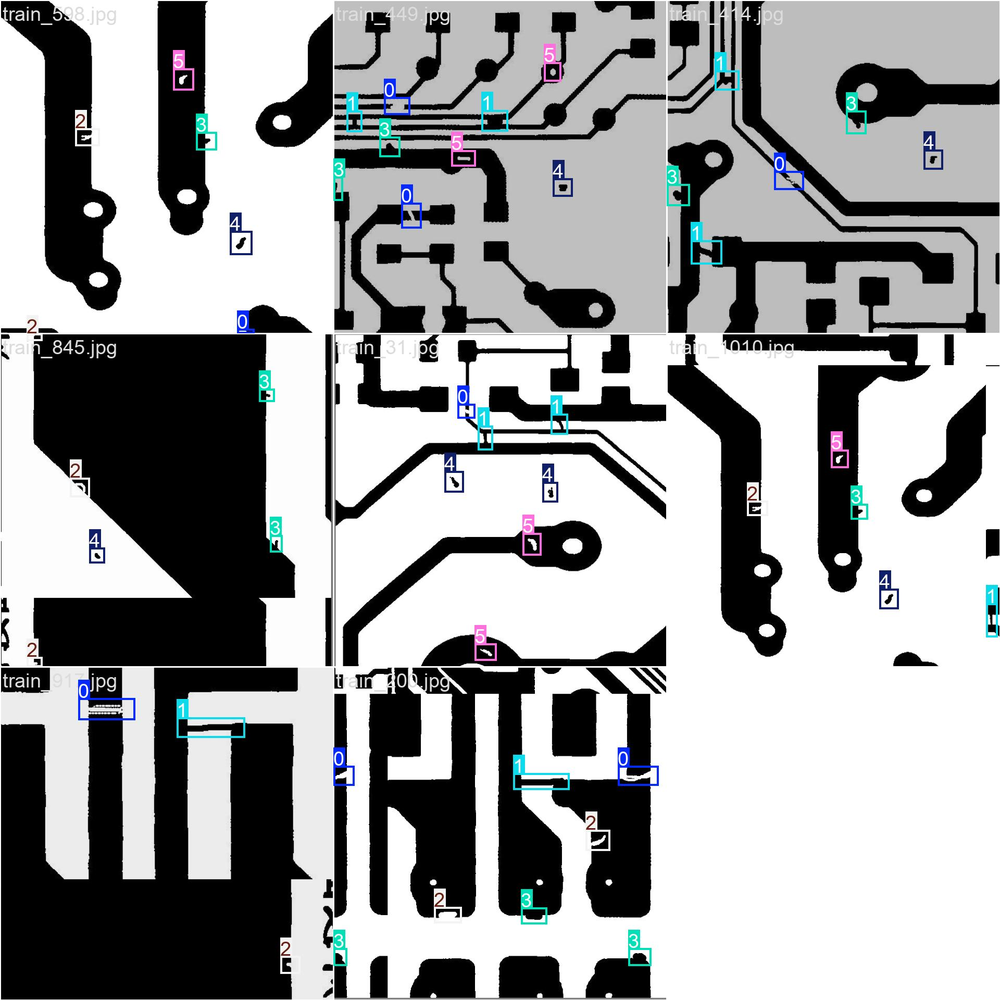

SHOWING: val_batch2_pred.jpg


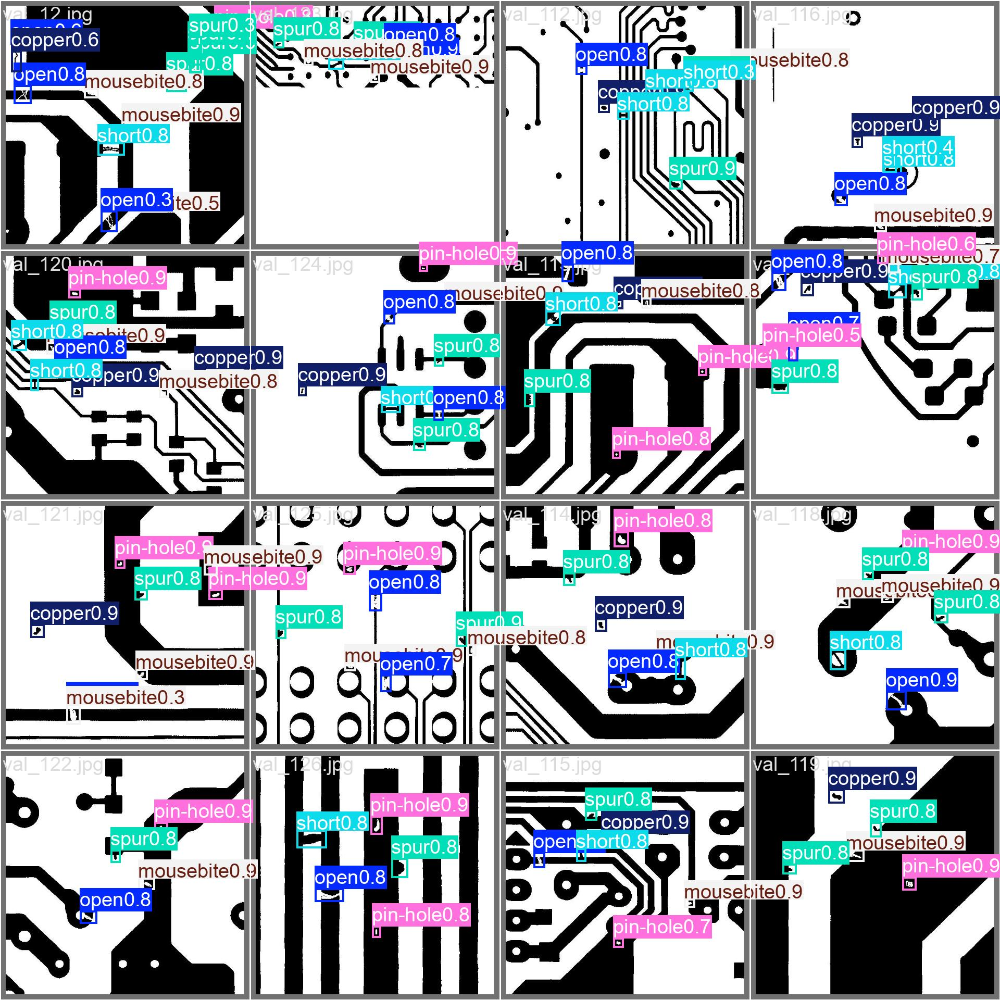

SHOWING: val_batch2_labels.jpg


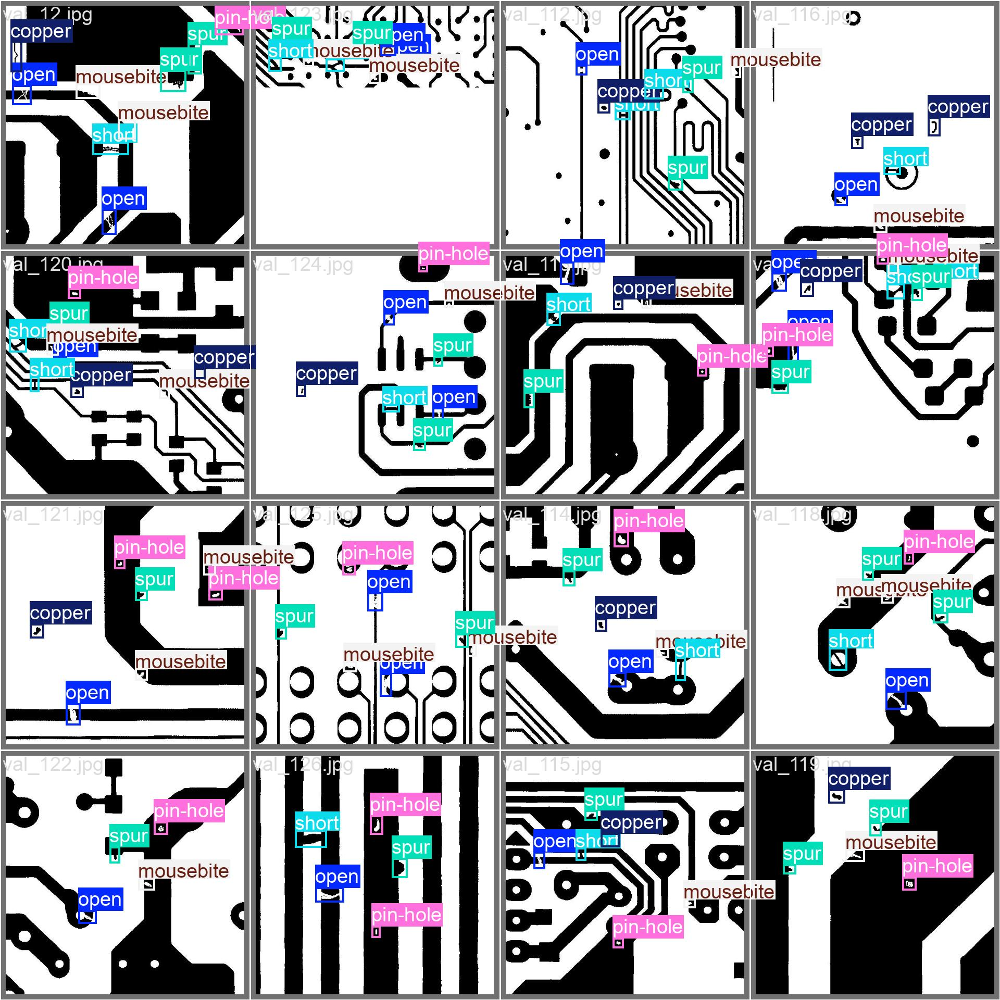

SHOWING: confusion_matrix.png


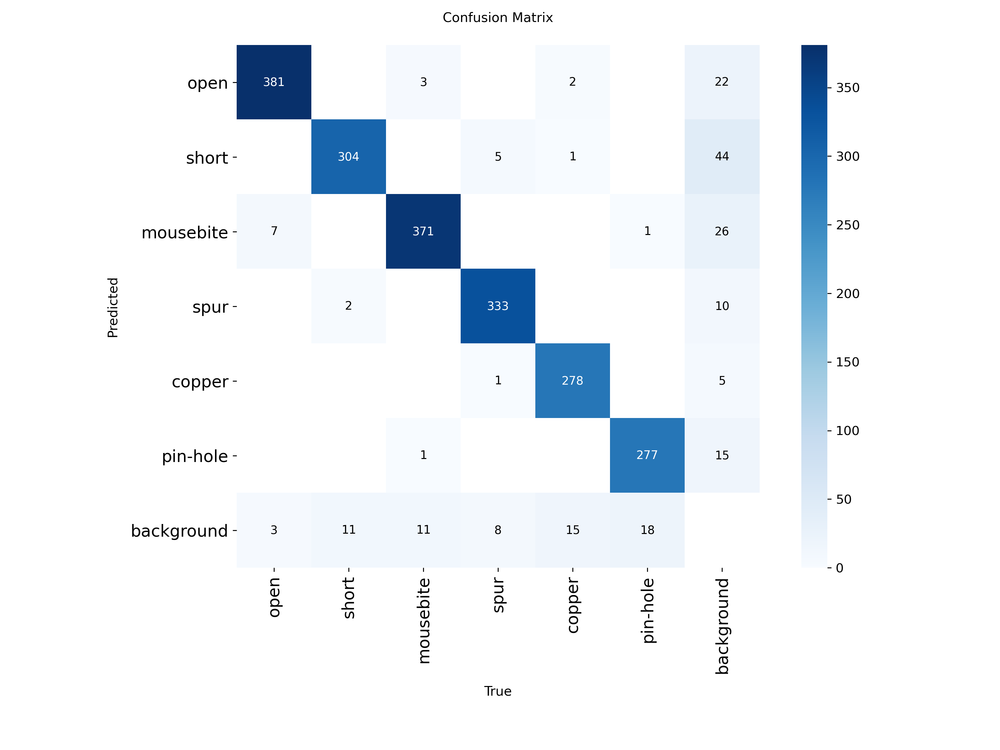

SHOWING: train_batch0.jpg


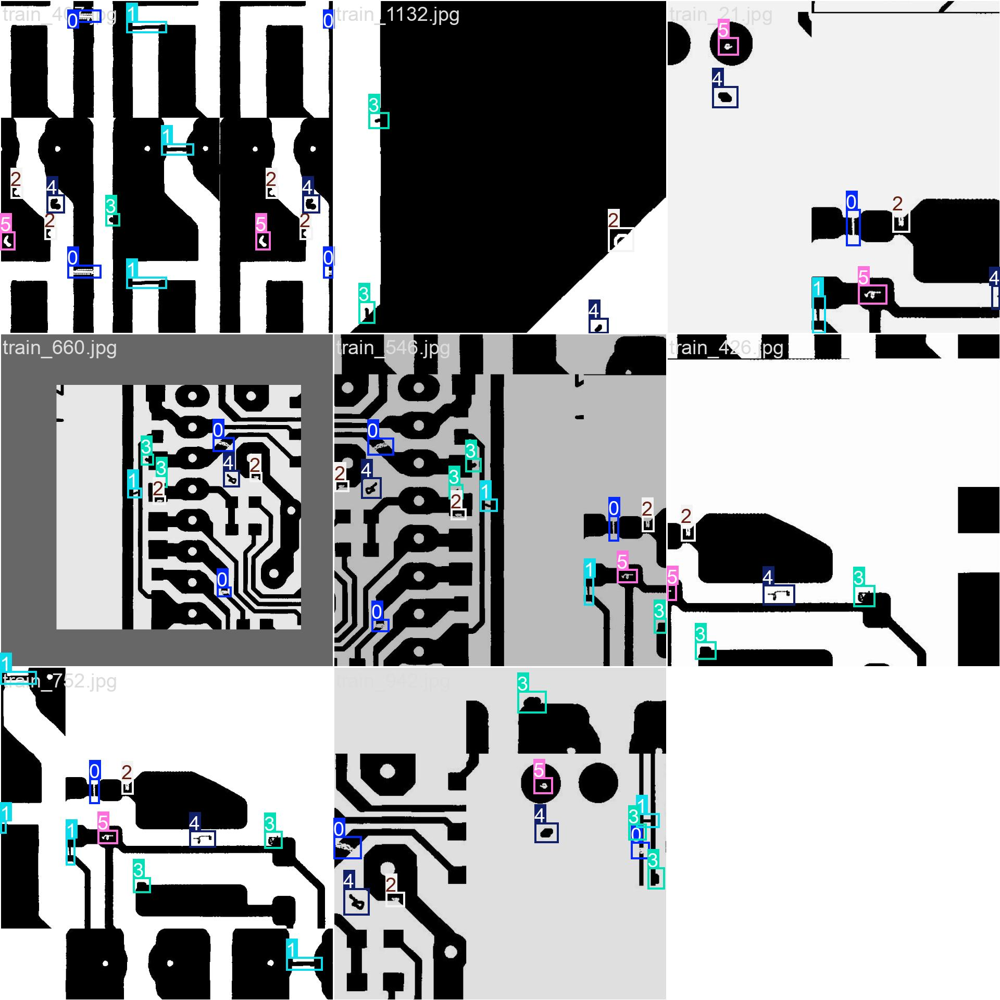

SHOWING: val_batch1_labels.jpg


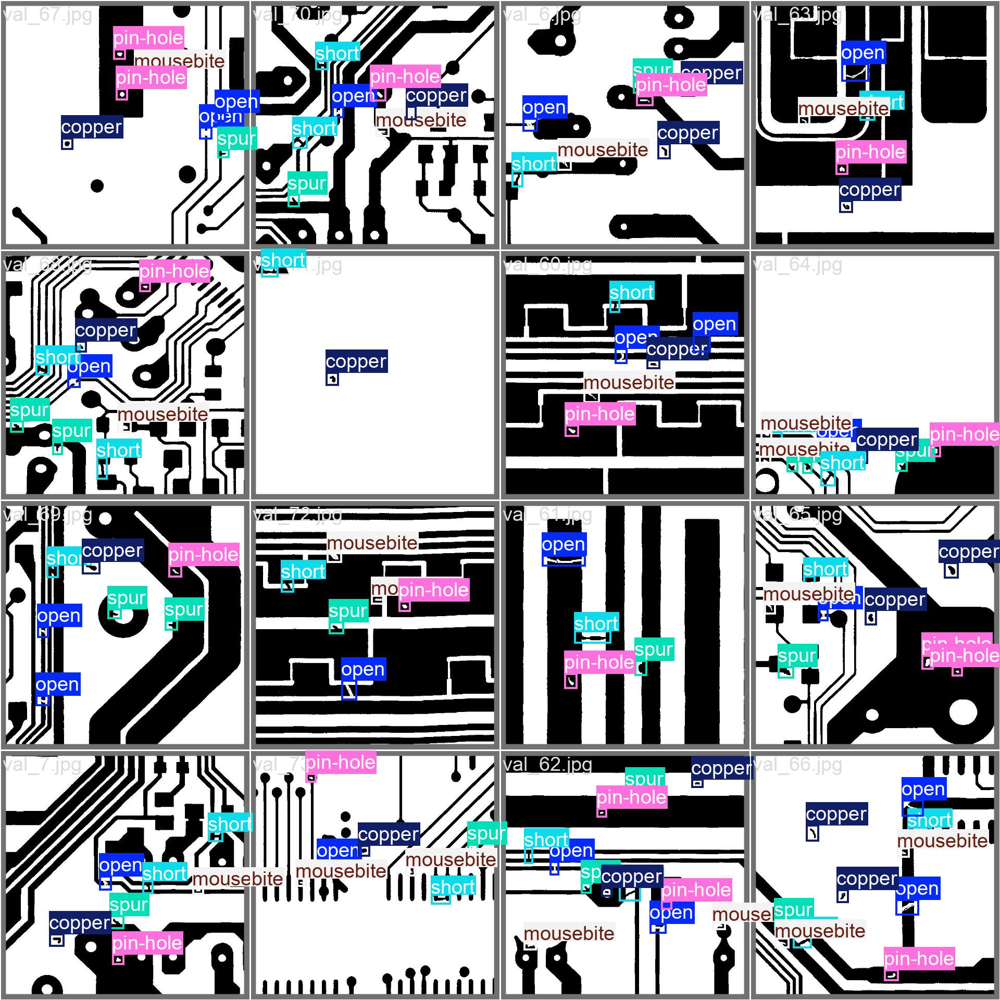

SHOWING: val_batch0_labels.jpg


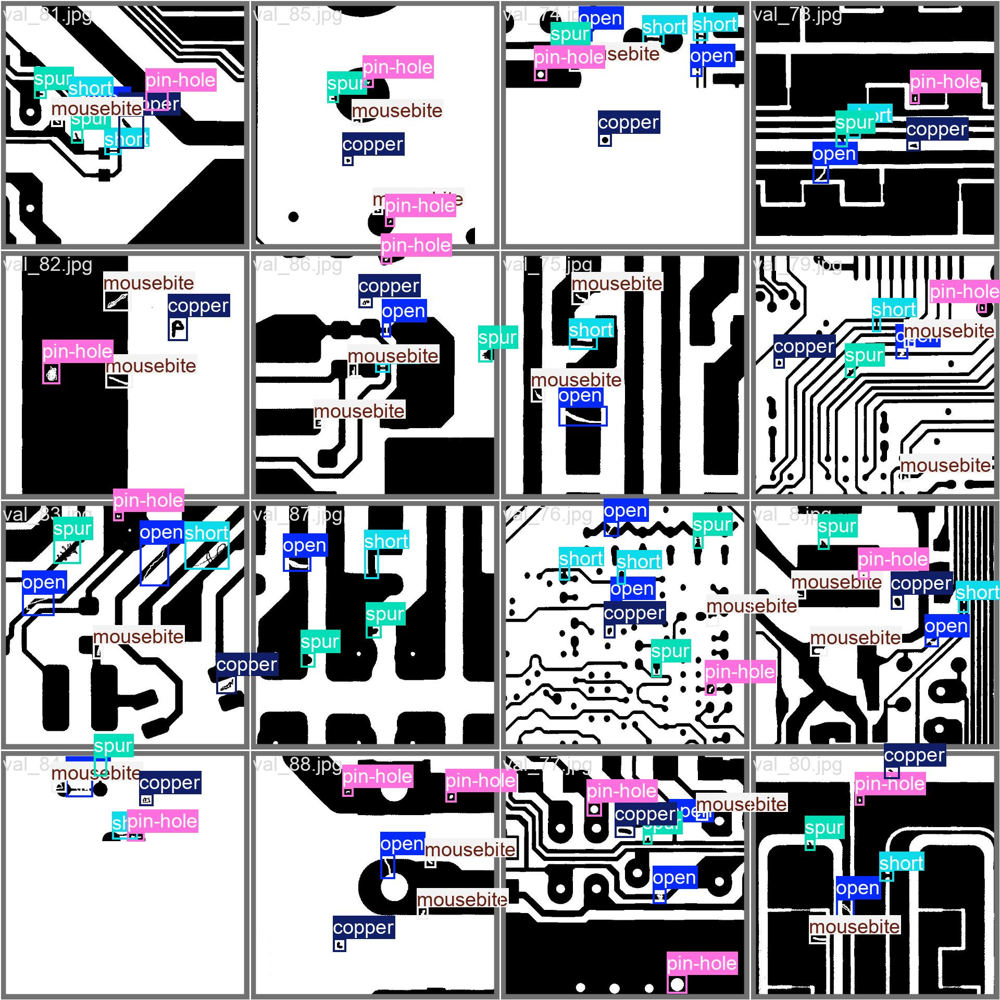

SHOWING: BoxP_curve.png


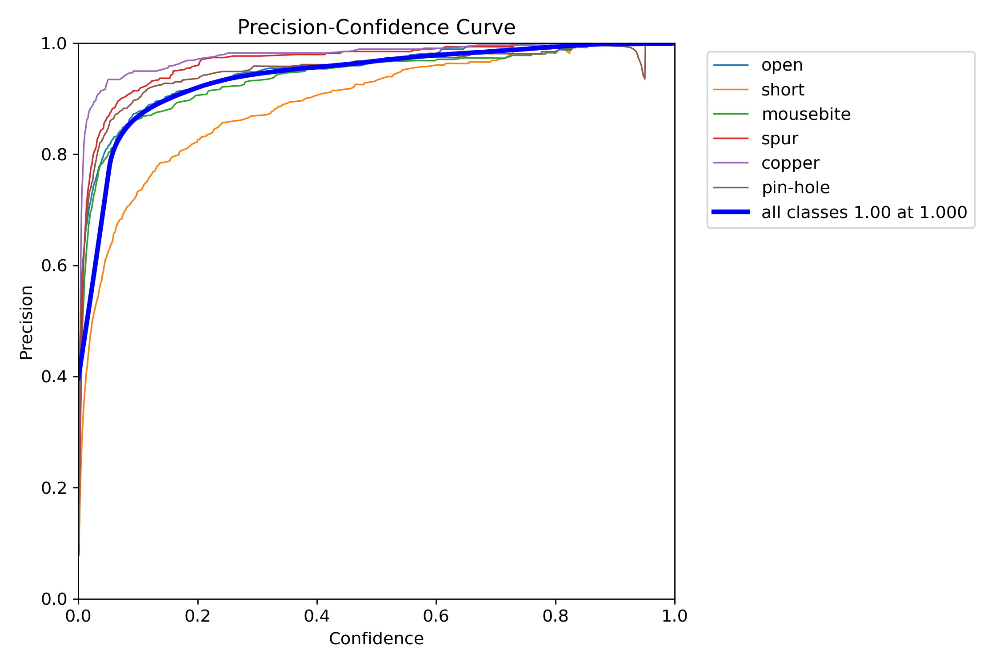

SHOWING: BoxR_curve.png


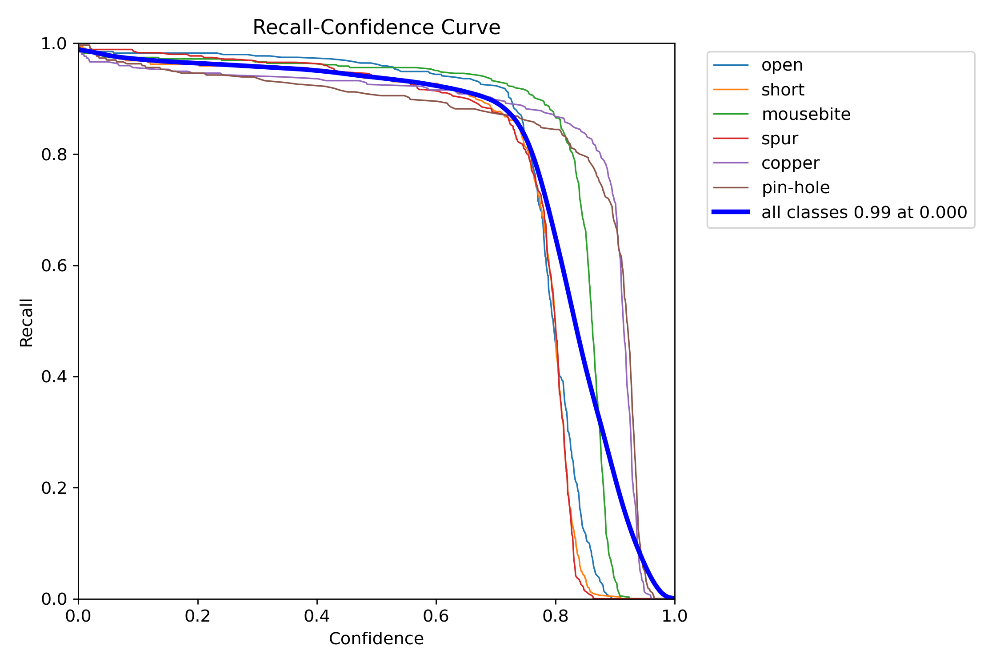

SHOWING: labels.jpg


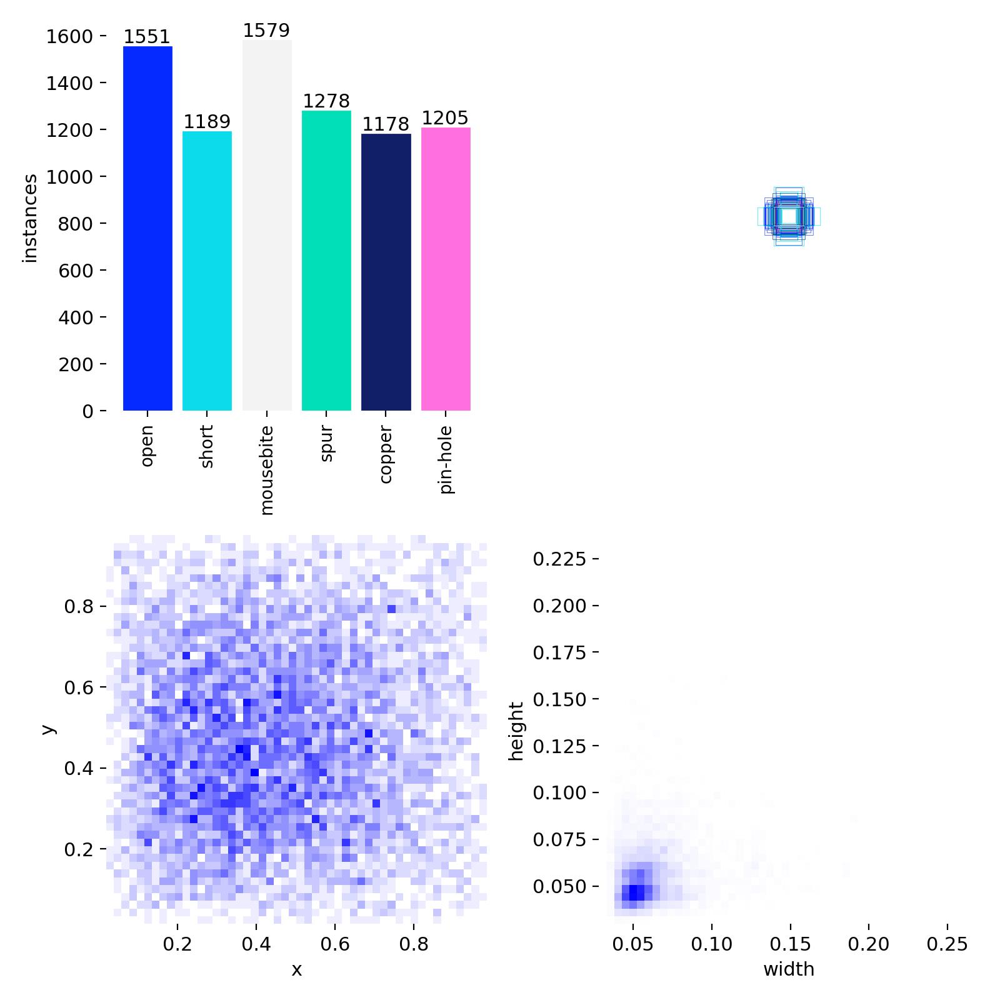

SHOWING: val_batch0_pred.jpg


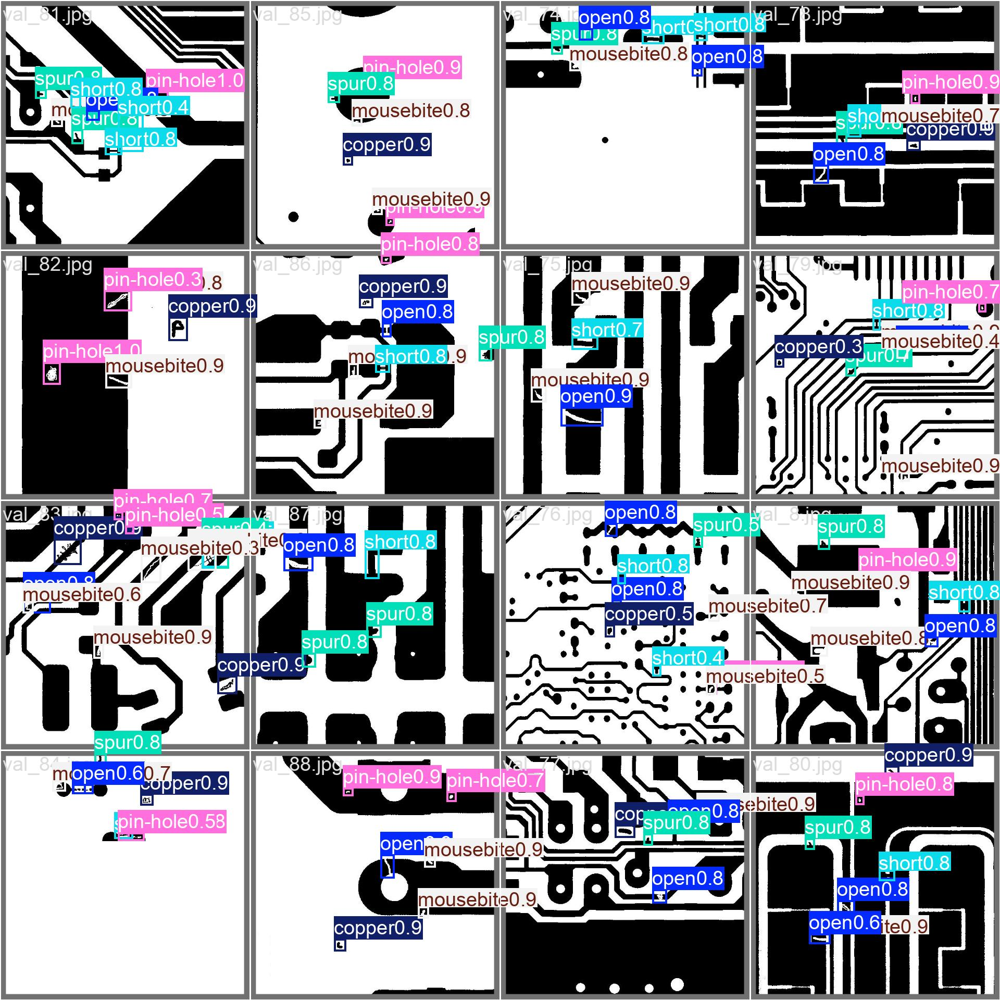

SHOWING: confusion_matrix_normalized.png


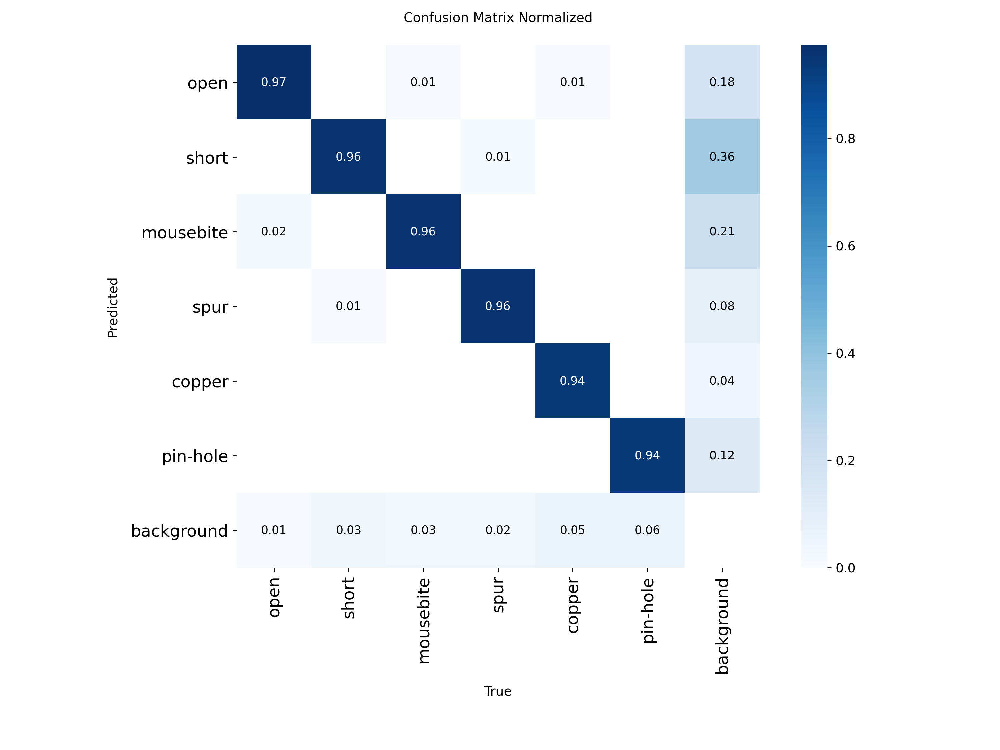

SHOWING: BoxF1_curve.png


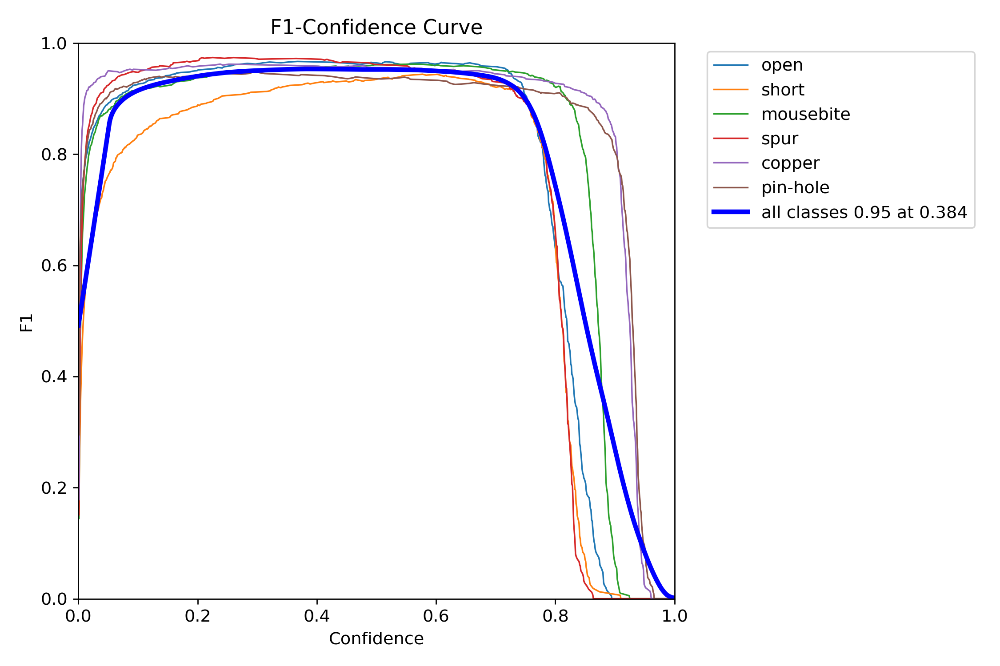

SHOWING: train_batch1.jpg


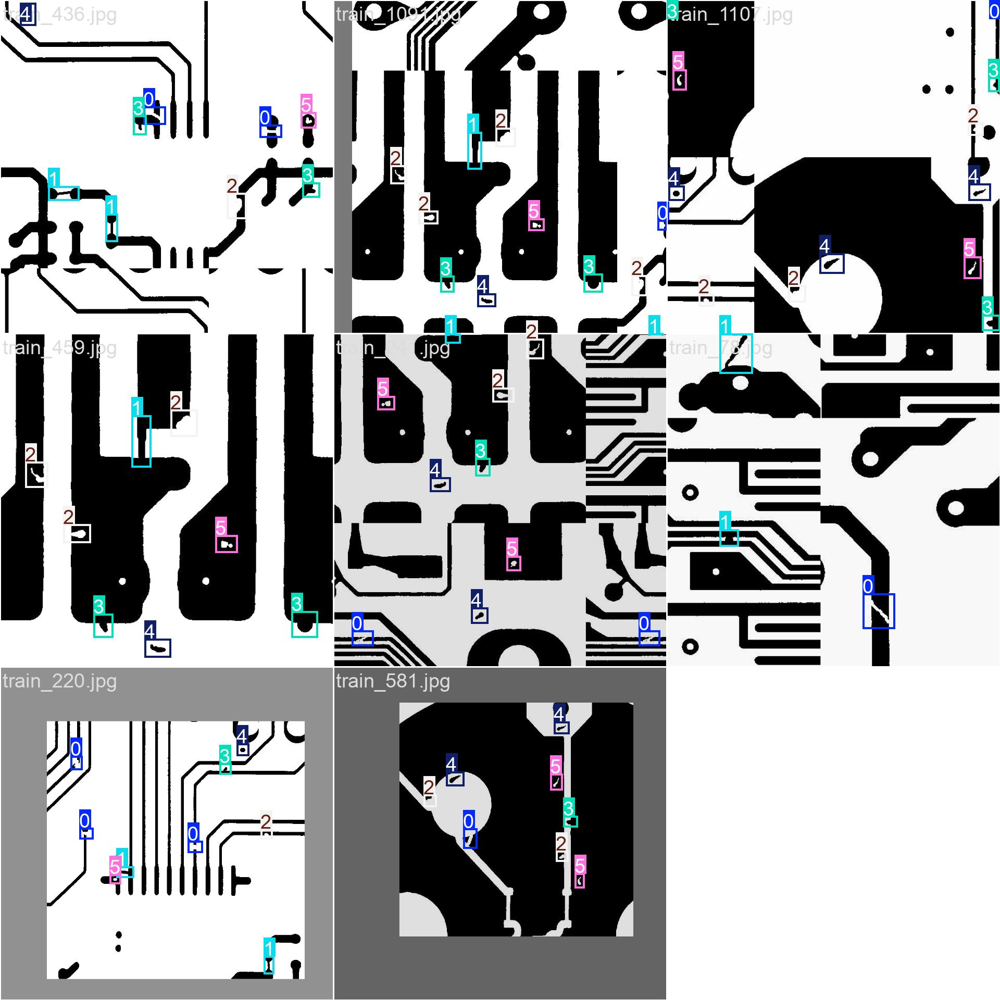

SHOWING: results.png


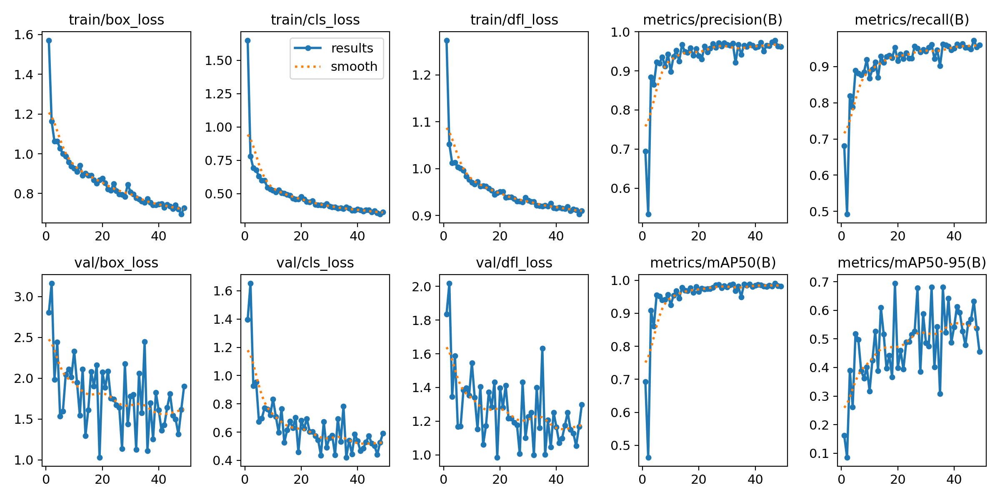

In [ ]:
import os
from IPython.display import Image, display

folder = '/content/runs/detect/train-5'

for file in os.listdir(folder):

    if file.endswith('.png') or file.endswith('.jpg'):

        print("SHOWING:", file)

        display(Image(filename=os.path.join(folder, file)))